<a href="https://colab.research.google.com/github/sirapop13/Low-pass-filter-effect-on-COVID-19-detection-convolutional-neural-network-model/blob/main/6302001_6302013_6302168_LPF_Covid19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Low-pass filter effect on COVID-19 detection convolutional neural network model

# Import

In [1]:
!pip install -q kaggle

In [2]:
# Create a hidden directory named '.kaggle' in the user's home directory if it doesn't already exist.
!mkdir -p ~/.kaggle

# Copy the 'kaggle.json' file, which contains the Kaggle API credentials, to the newly created '.kaggle' directory.
!cp kaggle.json ~/.kaggle/

# Change the file permissions of 'kaggle.json' to 600 to ensure that it is readable and writable by the file's owner only,
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d pranavraikokte/covid19-image-dataset

 98% 155M/158M [00:04<00:00, 43.0MB/s]
100% 158M/158M [00:04<00:00, 37.5MB/s]


In [4]:
!unzip -q covid19-image-dataset.zip

In [5]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as kr
import matplotlib.pyplot as plt
from PIL import Image
import os

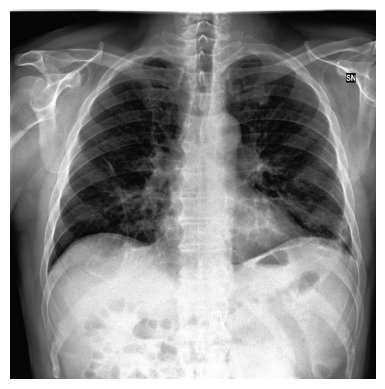

In [6]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'

if os.path.exists(image_path):
    # Open and display the image
    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
else:
    print("The image path does not exist. Please check your dataset structure and path.")

# Load dataset

In [47]:
# Define the image height and width that will be used to resize the images as they are read in.
img_height = 224
img_width = 224

# Define the batch size, which is the number of images processed before the model's internal parameters are updated.
batch_size = 32

# Create a training dataset by reading images from a directory.
# '/content/Covid19-dataset/train/' is the path where training images are stored, organized into subdirectories by class.
# The 'seed' parameter ensures that the shuffling of images is reproducible for consistent training results.
# 'image_size' specifies the target size of the images after resizing, defined by img_height and img_width.
# 'batch_size' determines how many images are contained in each batch of data.
train_ds = kr.utils.image_dataset_from_directory(
    "/content/Covid19-dataset/train/",
    seed = 753,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

# Create a test dataset for evaluating the model.
# The test dataset is loaded from '/content/Covid19-dataset/test', with the same seed, image size, and batch size as the training dataset.
test_ds = kr.utils.image_dataset_from_directory(
    "/content/Covid19-dataset/test",
    seed = 753,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

# Extract and print the class names detected in the test dataset directory structure.
# These class names are inferred from the directory names under the main dataset directory
# the labels that the model will predict.
class_names = test_ds.class_names

Found 251 files belonging to 3 classes.
Found 66 files belonging to 3 classes.


In [48]:
def count(counts, batch):
  # Unpack the features and labels from the batch.
  features, labels = batch

  # Identify instances of class 1, convert boolean to int, and accumulate their count.
  class_1 = tf.cast(labels == 1, tf.int32)
  counts['class_1'] += tf.reduce_sum(class_1)

  # Repeat the process for class 0.
  class_0 = tf.cast(labels == 0, tf.int32)
  counts['class_0'] += tf.reduce_sum(class_0)

  # Repeat the process for class 2, but there's a mistake:
  # It mistakenly casts class_0 instead of class_2. This should be corrected to labels == 2.
  class_2 = tf.cast(labels == 0, tf.int32)  # Error: should be (labels == 2)
  counts['class_2'] += tf.reduce_sum(class_2)

  # Return the updated counts.
  return counts

# Initialize counts for each class and process the first 10 batches from train_ds to update counts.
counts = train_ds.take(10).reduce(
    initial_state={'class_0': 0, 'class_1': 0, 'class_2' : 0},
    reduce_func=count)

# Convert counts to a numpy array, and calculate fractions of each class.
counts = np.array([counts['class_0'].numpy(),
                   counts['class_1'].numpy(),
                   counts['class_2'].numpy()]).astype(np.float32)
fractions = counts / counts.sum()

# Print the fraction of instances for each class.
print(fractions)

[0.380137   0.23972602 0.380137  ]


In [49]:
def class_func(features, label):
  # This function receives a pair of features and a label. It returns only the label, ignoring the features.
  return label

In [73]:
# Unbatch the dataset: Breaks down the dataset from batches into individual samples.
resample_ds = (
    train_ds
    .unbatch()

    # Apply rejection resampling: Adjusts the distribution of data to match the target distribution.
    # `class_func` is used to extract labels for the resampling decision.
    # `target_dist` specifies the desired distribution of classes after resampling.
    # `initial_dist` provides the initial distribution, which guides how the resampling is performed.
    .rejection_resample(class_func, target_dist=[0.33, 0.33, 0.33], initial_dist=fractions)

    # Rebatch the dataset: After resampling, reorganize the samples back into batches.
    .batch(32)
)

# Map function to remove the extra labels added by `rejection_resample`.
# `rejection_resample` outputs a dataset with a structure of (extra_label, (features, label)),
# where `extra_label` is a duplicate of `label`. This map operation removes the extra label.
balanced_train_ds = resample_ds.map(lambda extra_label, features_and_label: features_and_label)

# TensorFlow's AUTOTUNE is used to dynamically adjust the amount of computational resources
AUTOTUNE = tf.data.AUTOTUNE

# First, determine the size of balanced dataset
DATASET_SIZE = sum(1 for _ in balanced_train_ds)

# Define the split sizes
TRAIN_SIZE = int(0.8 * DATASET_SIZE)
VAL_SIZE = DATASET_SIZE - TRAIN_SIZE

# Shuffle the dataset before splitting
balanced_train_ds = balanced_train_ds.shuffle(DATASET_SIZE)

# Split the dataset
train_ds = balanced_train_ds.take(TRAIN_SIZE)
val_ds = balanced_train_ds.skip(TRAIN_SIZE)

# Now, apply caching and prefetching for performance optimization
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

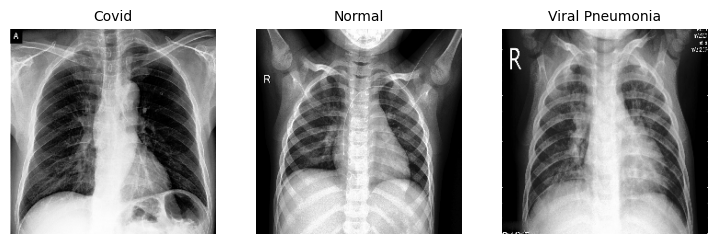

In [62]:
def show_examples(dataset, class_names, num_examples=3):
    plt.figure(figsize=(9, 9))
    for images, labels in dataset.take(1):
        for i in range(num_examples):
            ax = plt.subplot(1, num_examples, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_names[labels[i]], fontsize = 'medium')
            plt.axis("off")
    plt.show()

show_examples(train_ds, class_names)

In [63]:
for images, labels in train_ds.take(1):
    # Take the first image in the batch
    sample_image = images[0]
    size = sample_image.shape[:2]
    rows, cols = size
    # Print the shape of the image
    print(type(rows), cols)

<class 'int'> 224


# Low pass filter

In [64]:
# generate low-pass filter
def tf_generate_low_pass(percentage, im_size):
    # Define the dimensions of the image.
    rows, cols = im_size
    # Calculate the center of the image for use in distance calculations.
    center = (tf.cast(rows, tf.float32) / 2, tf.cast(cols, tf.float32) / 2)

    # Determine the maximum radius, which is half the size of the smallest dimension.
    max_radius = min(rows, cols) / 2
    # Calculate the cutoff distance based on the percentage provided.
    d0 = max_radius * percentage / 100

    # Create a grid of coordinates (y, x), with origin at the top left corner.
    y, x = tf.meshgrid(tf.range(rows), tf.range(cols), indexing='ij')
    # Cast coordinates to float for distance calculation.
    x = tf.cast(x, tf.float32)
    y = tf.cast(y, tf.float32)

    # Calculate the distance of each point from the center.
    distance = tf.sqrt((x - center[1])**2 + (y - center[0])**2)
    # Create the low-pass filter mask: 1s within cutoff distance, 0s outside.
    lp_filter = tf.cast(distance <= d0, tf.float32)

    return lp_filter

In [65]:
def visualize_filter(percentage, im_size):
    # Generate a low-pass filter using the specified percentage and image size.
    lp_filter = tf_generate_low_pass(percentage, im_size)

    # Set up the figure for visualization.
    plt.figure(figsize=(3, 3))

    # Display the filter as an image with grayscale color mapping.
    plt.imshow(lp_filter, cmap='gray')

    # Add a title indicating the percentage of the low-pass filter.
    plt.title(f"Low Pass Filter {percentage}%", fontsize='medium')

    # Hide the axes for a cleaner look.
    plt.axis('off')

    # Show the plot.
    plt.show()

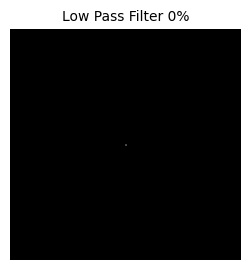

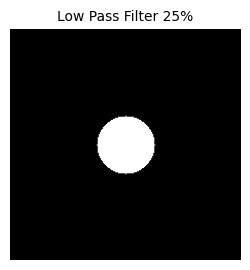

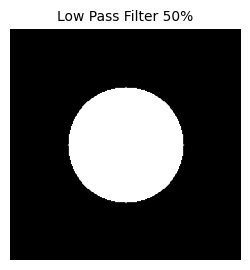

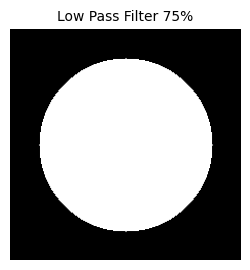

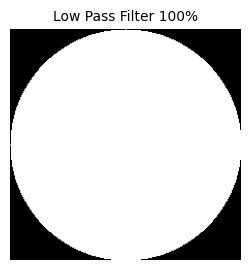

In [66]:
visualize_filter(0, (224, 224))
visualize_filter(25, (224, 224))
visualize_filter(50, (224, 224))
visualize_filter(75, (224, 224))
visualize_filter(100, (224, 224))

In [67]:
def apply_fft_low_pass(image, percentage=10):
  # Convert the image to grayscale (while keeping the batch dimension)
  image_grayscale = tf.image.rgb_to_grayscale(image)

  # Normalize the grayscale image
  image_2d = tf.squeeze(image_grayscale, axis=-1)
  image_2d_normalized = tf.cast(image_2d, tf.float32) / 255.0

  if percentage == 100:
    img_back_rgb = tf.image.grayscale_to_rgb(image_grayscale)

  else:
    # Apply FFT
    f = tf.signal.fft2d(tf.cast(image_2d_normalized, tf.complex64))
    fshift = tf.signal.fftshift(f)

    # Generate and apply low pass filter
    lp_filter = tf_generate_low_pass(percentage, image_2d_normalized.shape)
    lp_filter = tf.cast(lp_filter, tf.complex64)
    fshift_filtered = fshift * lp_filter

    # Inverse FFT
    ifshift = tf.signal.ifftshift(fshift_filtered)
    img_back = tf.signal.ifft2d(ifshift)
    img_back_abs = tf.abs(img_back)  # Take the absolute value

    img_back_clipped = tf.clip_by_value(img_back_abs, 0.0, 1.0)  # Clip the absolute values
    img_back_3d = tf.expand_dims(img_back_clipped*255.0, axis=-1)  # Expand dimensions to maintain the original shape

    img_back_rgb = tf.image.grayscale_to_rgb(img_back_3d)

  return img_back_rgb

In [68]:
def visualize_fft_low_pass(image, percentage=10, i=0):

  # Convert the image to grayscale (while keeping the batch dimension)
  image_grayscale = tf.image.rgb_to_grayscale(image)

  # Normalize the grayscale image
  image_2d = tf.squeeze(image_grayscale, axis=-1)
  image_2d_normalized = tf.cast(image_2d, tf.float32) / 255.0

  # Plot the original image.
  plt.subplot(i+1, 5, (5*i)+1)
  plt.imshow(image_2d_normalized, cmap='gray')
  plt.title('Original Image', fontsize='small')
  plt.axis("off")

  if percentage == 100:
    img_back_rgb = tf.image.grayscale_to_rgb(image_grayscale)


  else:
    # Perform FFT, shift zero frequency to center, and plot its magnitude spectrum.
    f = tf.signal.fft2d(tf.cast(image_2d_normalized, tf.complex64))
    fshift = tf.signal.fftshift(f)
    mag = tf.math.abs(fshift)

    plt.subplot(i+1, 5, (5*i)+2)
    plt.imshow(tf.math.log(mag), cmap = 'gray')
    plt.title('FFT', fontsize='small')
    plt.axis("off")

    # Generate a low-pass filter and plot it.
    lp_filter_o = tf_generate_low_pass(percentage, image_2d_normalized.shape)
    lp_filter = tf.cast(lp_filter_o, tf.complex64)

    plt.subplot(i+1, 5, (5*i)+3)
    plt.imshow(lp_filter_o, cmap='gray')
    plt.title(f"Cut {percentage}%", fontsize='small')
    plt.axis('off')

    # Apply the low-pass filter to the shifted FFT and plot the result.
    fshift_filtered = fshift * lp_filter
    plt.subplot(i+1, 5, (5*i)+4)
    plt.imshow(tf.math.log(tf.abs(fshift_filtered)), cmap='gray')
    plt.title('After Filter', fontsize='small')
    plt.axis("off")

    # Perform the inverse FFT and plot the final filtered image.
    ifshift = tf.signal.ifftshift(fshift_filtered)
    img_back = tf.signal.ifft2d(ifshift)
    img_back_abs = tf.abs(img_back)  # Take the absolute value

    img_back_clipped = tf.clip_by_value(img_back_abs, 0.0, 1.0)  # Clip the absolute values
    img_back_3d = tf.expand_dims(img_back_clipped*255.0, axis=-1)  # Expand dimensions to maintain the original shape

    img_back_rgb = tf.image.grayscale_to_rgb(img_back_3d)

    plt.subplot(i+1, 5, (5*i)+5)
    plt.imshow(img_back_rgb.numpy().astype('uint8'), cmap='gray')
    plt.title('Inverse FFT', fontsize='small')
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return img_back_3d

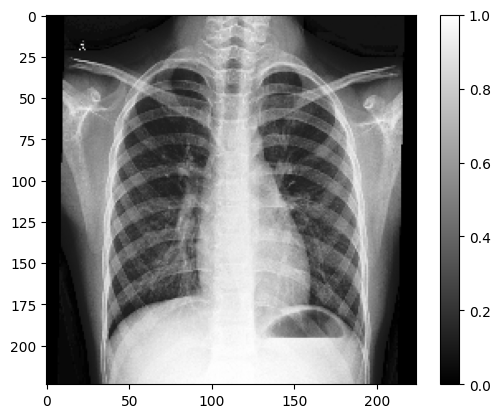

In [69]:
for images, _ in train_ds.shuffle(1000).take(1):
    original_image = images[0]
    original_image = original_image / 255.0
    plt.imshow(original_image, cmap='gray')
    plt.colorbar()
    plt.show()

In [70]:
def visualize_one_image_with_different_cuts(dataset, cut_percentages):
    # Shuffle the dataset and take one batch from it.
    for images, _ in dataset.shuffle(1000).take(1):
        original_image = images[0]  # Extract the first image from the batch.

        # Iterate over each percentage in cut_percentages.
        for i, percentage in enumerate(cut_percentages):
            # Apply the FFT-based low pass filter with the current percentage and visualize the process.
            # Note: The visualize_fft_low_pass function is expected to create its own subplot,
            # so it directly affects the global plt figure.
            processed_image = visualize_fft_low_pass(original_image, percentage, i)

    # Adjust the layout and show the final visualization containing all the filtered images.
    plt.tight_layout()
    plt.show()

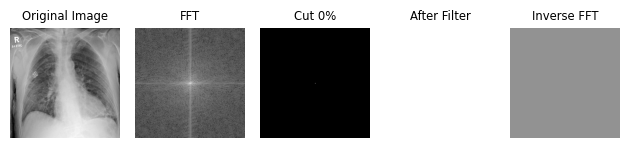

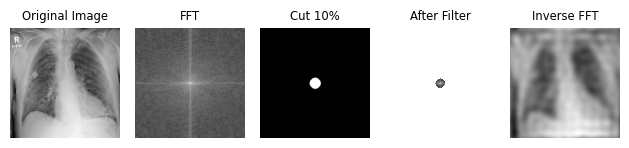

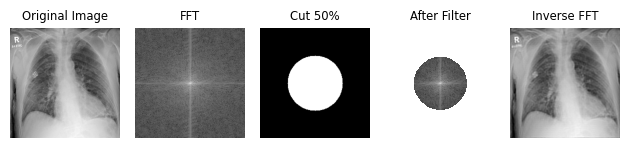

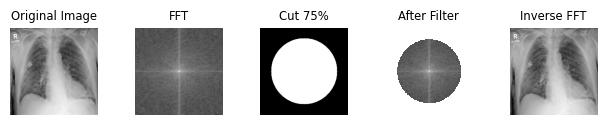

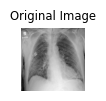

In [71]:
cut_percentages = [0, 10, 50, 75, 100]
visualize_one_image_with_different_cuts(train_ds, cut_percentages)

In [74]:
def apply_fft_low_pass_to_batch(images, percentage=10):
    """
    Applies the FFT-based low-pass filter to each image in a batch.

    Args:
        images: A batch of images, a 4D tensor of shape [batch_size, height, width, channels].
        percentage: The percentage of the frequency spectrum to retain.

    Returns:
        A 4D tensor of the same shape as `images`, with the low-pass filter applied to each image.
    """
    # Use tf.map_fn to apply 'apply_fft_low_pass' function to each image in the batch.
    # The lambda function ensures that 'apply_fft_low_pass' is called on each image.
    processed_images = tf.map_fn(lambda x: apply_fft_low_pass(x, percentage), images, dtype=tf.float32)
    return processed_images

def apply_filtered_dataset(dataset, percentage=10):
    """
    Applies the FFT-based low-pass filter to all images in a dataset.

    Args:
        dataset: A tf.data.Dataset object containing (images, labels) pairs.
        percentage: The percentage of the frequency spectrum to retain for the low-pass filter.

    Returns:
        A tf.data.Dataset object with the low-pass filter applied to each image.
    """
    # Define a helper function to apply the filter to a batch of images, preserving labels.
    def _apply_filter(images, labels):
        return apply_fft_low_pass_to_batch(images, percentage), labels

    # Apply the helper function to each element (batch) in the dataset.
    filtered_dataset = dataset.map(_apply_filter)
    return filtered_dataset

# Dictionaries to store the filtered datasets for training, validation, and testing.
filtered_train_datasets = {}
filtered_val_datasets = {}
filtered_test_datasets = {}

# Loop through a range of cutoff percentages to create filtered datasets at each level of filtering.
for cut_percentage in range(0, 101):
    # Filter the training, validation, and testing datasets with the current cutoff percentage.
    filtered_train_datasets[cut_percentage] = apply_filtered_dataset(train_ds, percentage=cut_percentage)
    filtered_val_datasets[cut_percentage] = apply_filtered_dataset(val_ds, percentage=cut_percentage)
    filtered_test_datasets[cut_percentage] = apply_filtered_dataset(test_ds, percentage=cut_percentage)

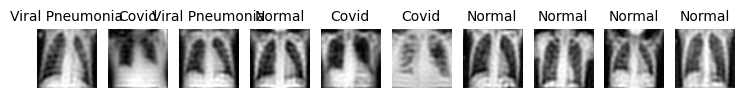

In [182]:
def show_examples_filtered(dataset, class_names, num_examples=10):
    plt.figure(figsize=(9, 9))
    for images, labels in dataset.take(1):
        for i in range(num_examples):
            ax = plt.subplot(1, num_examples, i + 1)
            plt.imshow(images[i].numpy().astype('uint8'), cmap = 'gray')
            plt.title(class_names[labels[i]], fontsize = 'medium')
            plt.axis("off")
    plt.show()

show_examples_filtered(filtered_train_datasets[10], class_names)

# Model

## load CNN

In [80]:
!pip install tensorflow

In [314]:
import tensorflow as tf

# Define the initial and final learning rates for the training process.
initial_learning_rate = 0.0001
final_learning_rate = 0.00001
# Specify the total number of epochs for training.
epochs = 20

def linear_learning_rate(epoch):
    """
    Calculates a linearly decreasing learning rate for each epoch.

    Args:
        epoch: The current epoch number during training.

    Returns:
        The calculated learning rate for the current epoch.
    """
    # Calculate the learning rate for the current epoch using linear interpolation
    # between the initial and final learning rates.
    lr = initial_learning_rate + (final_learning_rate - initial_learning_rate) / epochs * epoch
    return lr

# Create a LearningRateScheduler callback using the linear learning rate function.
# This callback adjusts the learning rate for each epoch according to the function.
lr_schedule_callback = tf.keras.callbacks.LearningRateScheduler(linear_learning_rate, verbose=1)

In [315]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Define the ModelCheckpoint callback to save the best model weights during training.
checkpoint_callback = ModelCheckpoint(
    filepath='/content/model_best_weights_40.h5',  # Specify the file path for saving the best model weights.
    monitor='val_accuracy',  # Monitor the validation accuracy for improvements.
    save_best_only=True,  # Ensure that only the best model weights are saved based on the monitored metric.
    save_weights_only=True,  # Save only the model's weights instead of the entire model.
    mode='max',  # Set the mode to 'max' because we aim to maximize the validation accuracy.
    verbose=1  # Enable logging for when the model weights are saved.
)

# Define the EarlyStopping callback to stop training early if no improvement is seen.
early_stop = EarlyStopping(
    monitor='val_loss',  # Monitor the validation loss for improvements.
    patience=5,  # Number of epochs with no improvement after which training will be stopped.
    verbose=1  # Enable logging for when the training is stopped early.
)

In [310]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Load the ResNet50 model pre-trained on ImageNet without the top layer (fully connected layers).
# The model will accept input images of size (224, 224, 3).
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Allow the base model to be trainable for fine-tuning.
base_model.trainable = True

# Define the final model by adding a GlobalAveragePooling2D layer and a Dense output layer
# on top of the base model. The Dense layer's size is set to the number of classes in the dataset,
# and it uses a softmax activation function for multi-class classification.
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(len(class_names), activation='softmax')
])

# Compile the model with the Adam optimizer and sparse categorical crossentropy loss,
# which is appropriate for multi-class classification tasks where each label is an integer.
# The model will report accuracy as its performance metric.
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [282]:
import datetime
# Define the directory where TensorBoard logs will be stored.
# It uses the current date and time to create a unique directory for each training session.
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# Create a TensorBoard callback instance.
# `histogram_freq=1` means that histograms will be computed every epoch, which includes
# the distributions of the layer activations and weights.
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# The following IPython magic commands are specific to Jupyter notebooks or IPython environments
# and they enable the TensorBoard within the notebook interface.

# Load the TensorBoard notebook extension.
%reload_ext tensorboard

# Start TensorBoard within the notebook using the logs directory specified earlier.
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 76259), started 0:00:12 ago. (Use '!kill 76259' to kill it.)

<IPython.core.display.Javascript object>

## cut100

### train cut100


In [283]:
cut_percentage = 100  # Specify the percentage of the frequency spectrum to retain in the filtered dataset.

# Select the training and validation datasets filtered according to the specified cut_percentage.
model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Start training the model with the specified datasets.
history = model.fit(
    model_train_ds,  # The training dataset.
    validation_data=model_val_ds,  # The validation dataset for evaluation at the end of each epoch.
    epochs=epochs,  # The total number of epochs (iterations over the entire dataset) to train for.
    callbacks = [
        tensorboard_callback,  # For logging and visualization of training progress in TensorBoard.
        lr_schedule_callback,  # For adjusting the learning rate linearly over epochs.
        checkpoint_callback,  # For saving the best model weights based on validation accuracy.
        early_stop  # For stopping training early if the validation loss stops improving.
    ],
    shuffle = True  # Shuffling the dataset before each epoch starts.
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 29s 102ms/step - loss: 0.6084 - accuracy: 0.7233
Epoch 1: val_accuracy improved from -inf to 0.62500, saving model to /content/model_best_weights_100.h5
7/7 [==============================] - 35s 1s/step - loss: 0.6084 - accuracy: 0.7233 - val_loss: 1.3643 - val_accuracy: 0.6250 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.62500 to 0.64062, saving model to /content/model_best_weights_100.h5
7/7 [==============================] - 5s 801ms/step - loss: 0.0071 - accuracy: 1.0000 - val_loss: 1.5552 - val_accuracy: 0.6406 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.6

### Inference cut100

In [284]:
model.load_weights('/content/model_best_weights_100.h5')

In [285]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 24ms/step - loss: 0.1720 - accuracy: 0.9091
Test Loss: 0.17203815281391144
Test Accuracy: 0.9090909361839294


1/1 [==============================] - 1s 962ms/step


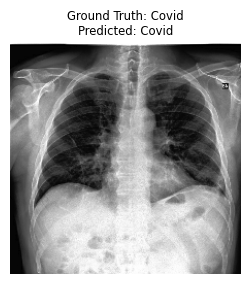

In [286]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut90

### train cut90


In [268]:
cut_percentage = 90

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 101ms/step - loss: 0.5504 - accuracy: 0.7816
Epoch 1: val_accuracy improved from -inf to 0.60938, saving model to /content/model_best_weights_90.h5
7/7 [==============================] - 36s 1s/step - loss: 0.5504 - accuracy: 0.7816 - val_loss: 1.8641 - val_accuracy: 0.6094 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0106 - accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.60938 to 0.62500, saving model to /content/model_best_weights_90.h5
7/7 [==============================] - 5s 802ms/step - loss: 0.0106 - accuracy: 1.0000 - val_loss: 2.1729 - val_accuracy: 0.6250 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve fro

### Inference cut90

In [269]:
model.load_weights('/content/model_best_weights_90.h5')

In [270]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 24ms/step - loss: 0.1006 - accuracy: 0.9697
Test Loss: 0.10061674565076828
Test Accuracy: 0.9696969985961914


1/1 [==============================] - 1s 984ms/step


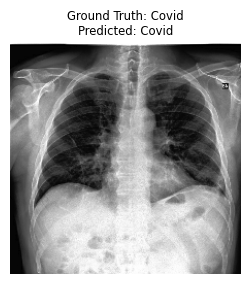

In [271]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut80

### train cut80

In [256]:
cut_percentage = 80

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 34s 102ms/step - loss: 0.4582 - accuracy: 0.8301
Epoch 1: val_accuracy improved from -inf to 0.62500, saving model to /content/model_best_weights_80.h5
7/7 [==============================] - 40s 1s/step - loss: 0.4582 - accuracy: 0.8301 - val_loss: 1.8643 - val_accuracy: 0.6250 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0091 - accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.62500 to 0.65625, saving model to /content/model_best_weights_80.h5
7/7 [==============================] - 5s 852ms/step - loss: 0.0091 - accuracy: 1.0000 - val_loss: 2.2483 - val_accuracy: 0.6562 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.656

### Inference cut80

In [257]:
model.load_weights('/content/model_best_weights_80.h5')

In [258]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 25ms/step - loss: 0.4062 - accuracy: 0.8485
Test Loss: 0.4061959385871887
Test Accuracy: 0.8484848737716675


1/1 [==============================] - 1s 1s/step


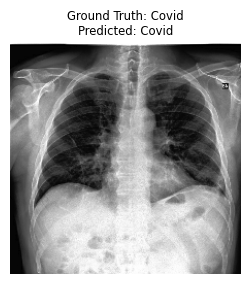

In [259]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut70

### train cut70


In [242]:
cut_percentage = 70

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 102ms/step - loss: 0.5289 - accuracy: 0.7864
Epoch 1: val_accuracy improved from -inf to 0.60938, saving model to /content/model_best_weights_70.h5
7/7 [==============================] - 35s 1s/step - loss: 0.5289 - accuracy: 0.7864 - val_loss: 1.9549 - val_accuracy: 0.6094 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0077 - accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.60938 to 0.62500, saving model to /content/model_best_weights_70.h5
7/7 [==============================] - 5s 808ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 2.0347 - val_accuracy: 0.6250 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.625

### Inference cut70

In [246]:
model.load_weights('/content/model_best_weights_70.h5')

In [247]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 25ms/step - loss: 0.2671 - accuracy: 0.8939
Test Loss: 0.26708561182022095
Test Accuracy: 0.8939393758773804


1/1 [==============================] - 0s 34ms/step


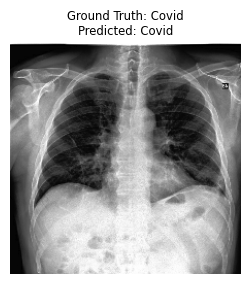

In [248]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut60

### train cut60


In [137]:
cut_percentage = 60

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 101ms/step - loss: 0.3733 - accuracy: 0.8689
Epoch 1: val_accuracy improved from -inf to 0.60938, saving model to /content/model_best_weights_60.h5
7/7 [==============================] - 35s 1s/step - loss: 0.3733 - accuracy: 0.8689 - val_loss: 2.3547 - val_accuracy: 0.6094 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0083 - accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.60938
7/7 [==============================] - 5s 781ms/step - loss: 0.0083 - accuracy: 1.0000 - val_loss: 2.6303 - val_accuracy: 0.6094 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.60938 to 0.62500, saving model to /content/model_best_weig

### Inference cut60

In [138]:
model.load_weights('/content/model_best_weights_60.h5')

In [139]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 25ms/step - loss: 0.4994 - accuracy: 0.8333
Test Loss: 0.4994032382965088
Test Accuracy: 0.8333333134651184


1/1 [==============================] - 1s 940ms/step


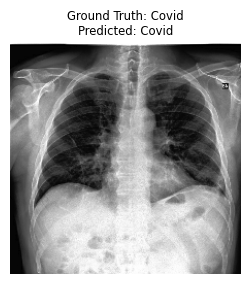

In [140]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut50

### train cut50

In [290]:
cut_percentage = 50

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 102ms/step - loss: 0.4708 - accuracy: 0.8301
Epoch 1: val_accuracy improved from -inf to 0.60938, saving model to /content/model_best_weights_50.h5
7/7 [==============================] - 35s 1s/step - loss: 0.4708 - accuracy: 0.8301 - val_loss: 2.0160 - val_accuracy: 0.6094 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0109 - accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.60938 to 0.62500, saving model to /content/model_best_weights_50.h5
7/7 [==============================] - 5s 842ms/step - loss: 0.0109 - accuracy: 1.0000 - val_loss: 2.2509 - val_accuracy: 0.6250 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.625

### Inference cut50

In [291]:
model.load_weights('/content/model_best_weights_50.h5')

In [292]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 25ms/step - loss: 0.2949 - accuracy: 0.8485
Test Loss: 0.29490551352500916
Test Accuracy: 0.8484848737716675


1/1 [==============================] - 1s 979ms/step


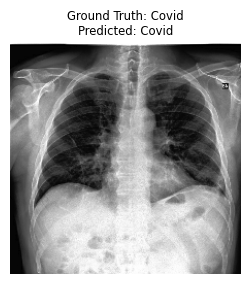

In [293]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut40

### train cut40

In [311]:
cut_percentage = 40

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 31s 102ms/step - loss: 0.4813 - accuracy: 0.8155
Epoch 1: val_accuracy improved from -inf to 0.64062, saving model to /content/model_best_weights_40.h5
7/7 [==============================] - 36s 1s/step - loss: 0.4813 - accuracy: 0.8155 - val_loss: 1.2945 - val_accuracy: 0.6406 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0080 - accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.64062
7/7 [==============================] - 5s 772ms/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 1.7118 - val_accuracy: 0.6406 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 0.64062
7/7 [==============================] - 5s 756

### Inference cut40

In [312]:
model.load_weights('/content/model_best_weights_40.h5')

In [313]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 24ms/step - loss: 2.5126 - accuracy: 0.4091
Test Loss: 2.5126302242279053
Test Accuracy: 0.40909090638160706


1/1 [==============================] - 1s 984ms/step


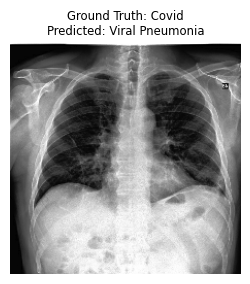

In [307]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut30

### train cut30

In [212]:
cut_percentage = 30

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 102ms/step - loss: 0.5190 - accuracy: 0.7573
Epoch 1: val_accuracy improved from -inf to 0.60938, saving model to /content/model_best_weights_30.h5
7/7 [==============================] - 35s 1s/step - loss: 0.5190 - accuracy: 0.7573 - val_loss: 1.3088 - val_accuracy: 0.6094 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0222 - accuracy: 0.9903
Epoch 2: val_accuracy improved from 0.60938 to 0.62500, saving model to /content/model_best_weights_30.h5
7/7 [==============================] - 5s 824ms/step - loss: 0.0222 - accuracy: 0.9903 - val_loss: 1.7037 - val_accuracy: 0.6250 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve fro

### Inference cut30

In [216]:
model.load_weights('/content/model_best_weights_30.h5')

In [217]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 24ms/step - loss: 2.9359 - accuracy: 0.3636
Test Loss: 2.935870409011841
Test Accuracy: 0.3636363744735718


1/1 [==============================] - 0s 25ms/step


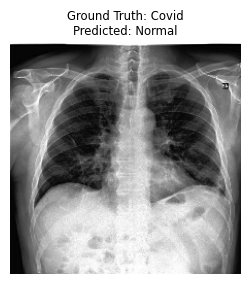

In [218]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut20

### train cut20

In [297]:
cut_percentage = 20

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 34s 101ms/step - loss: 0.4529 - accuracy: 0.8010
Epoch 1: val_accuracy improved from -inf to 0.60938, saving model to /content/model_best_weights_20.h5
7/7 [==============================] - 40s 1s/step - loss: 0.4529 - accuracy: 0.8010 - val_loss: 1.6724 - val_accuracy: 0.6094 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0127 - accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.60938
7/7 [==============================] - 5s 773ms/step - loss: 0.0127 - accuracy: 1.0000 - val_loss: 2.9868 - val_accuracy: 0.6094 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 0.60938
7/7 [==============================] - 5s 770

### Inference cut20

In [298]:
model.load_weights('/content/model_best_weights_20.h5')

In [299]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 24ms/step - loss: 4.5843 - accuracy: 0.3485
Test Loss: 4.584275245666504
Test Accuracy: 0.3484848439693451


1/1 [==============================] - 1s 983ms/step


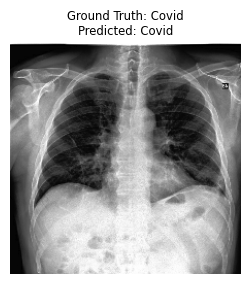

In [300]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut10

### train cut10

In [235]:
cut_percentage = 10

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 102ms/step - loss: 0.5291 - accuracy: 0.7573
Epoch 1: val_accuracy improved from -inf to 0.64062, saving model to /content/model_best_weights_10.h5
7/7 [==============================] - 36s 1s/step - loss: 0.5291 - accuracy: 0.7573 - val_loss: 1.3965 - val_accuracy: 0.6406 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.0228 - accuracy: 0.9951
Epoch 2: val_accuracy did not improve from 0.64062
7/7 [==============================] - 5s 781ms/step - loss: 0.0228 - accuracy: 0.9951 - val_loss: 2.2909 - val_accuracy: 0.6094 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 0.64062
7/7 [==============================] - 5s 758

### Inference cut10

In [236]:
model.load_weights('/content/model_best_weights_10.h5')

In [237]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 25ms/step - loss: 3.1781 - accuracy: 0.3788
Test Loss: 3.1781415939331055
Test Accuracy: 0.3787878751754761


1/1 [==============================] - 1s 914ms/step


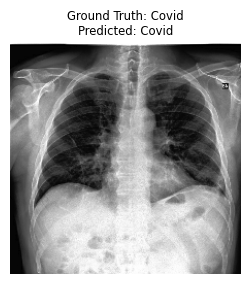

In [238]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

## cut0

### train cut0

In [205]:
cut_percentage = 0

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]

# Train the model
history = model.fit(
    model_train_ds,
    validation_data=model_val_ds,
    epochs=epochs,
    callbacks = [tensorboard_callback, lr_schedule_callback, checkpoint_callback, early_stop],
    shuffle = True
    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
      7/Unknown - 30s 101ms/step - loss: 0.9385 - accuracy: 0.5922
Epoch 1: val_accuracy improved from -inf to 0.20312, saving model to /content/model_best_weights_0.h5
7/7 [==============================] - 35s 1s/step - loss: 0.9385 - accuracy: 0.5922 - val_loss: 1.1163 - val_accuracy: 0.2031 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.55e-05.
Epoch 2/20
7/7 [==============================] - ETA: 0s - loss: 0.8347 - accuracy: 0.6505
Epoch 2: val_accuracy improved from 0.20312 to 0.21875, saving model to /content/model_best_weights_0.h5
7/7 [==============================] - 5s 800ms/step - loss: 0.8347 - accuracy: 0.6505 - val_loss: 1.1927 - val_accuracy: 0.2188 - lr: 9.5500e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.1e-05.
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.7881 - accuracy: 0.6553
Epoch 3: val_accuracy did not improve from 

### Inference cut0

In [206]:
model.load_weights('/content/model_best_weights_0.h5')

In [207]:
model_test_ds = filtered_test_datasets[cut_percentage]
loss, accuracy = model.evaluate(model_test_ds)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

3/3 [==============================] - 0s 25ms/step - loss: 1.1586 - accuracy: 0.3788
Test Loss: 1.1586127281188965
Test Accuracy: 0.3787878751754761


1/1 [==============================] - 1s 987ms/step


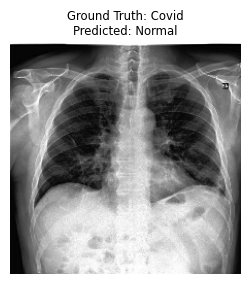

In [208]:
image_path = '/content/Covid19-dataset/test/Covid/0100.jpeg'
image = tf.io.read_file(image_path)
image = tf.image.decode_png(image, channels=3)
image = tf.image.resize(image, [224, 224])
image = image / 255.0  # Scale pixel values to [0, 1]
image_batch = tf.expand_dims(image, 0)

predictions = model.predict(image_batch)
predicted_class = tf.argmax(predictions, axis=1)

plt.figure(figsize=(3, 3))
plt.imshow(image.numpy())
ground_truth = 'Covid'  # Set the ground truth label for the image
plt.title(f"Ground Truth: {ground_truth}\nPredicted: {class_names[predicted_class.numpy()[0]]}", fontsize='small')
plt.axis('off')
plt.show()

# PCA

In [358]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Sequential

# Determine the number of classes for the final dense layer from the class names.
num_classes = len(class_names)

# Initialize the ResNet50 model without the top layer (fully connected layers),
# not loading any pre-trained weights, and specifying the input shape.
base_model = ResNet50(weights=None, include_top=False, input_shape=(224, 224, 3))

# Create a new model on top of the base model with an additional GlobalAveragePooling2D layer
# and a Dense output layer for classification. The Dense layer's size matches the number of classes,
# using softmax activation for multi-class classification.
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(num_classes, activation='softmax')
])

# Path to the model weights saved after training with a specific cutoff.
weight_path = '/content/model_best_weights_90.h5'

# Load the saved weights into the model after achieving the best validation accuracy.
model.load_weights(weight_path)

# Create a feature extraction model by reusing the base model from the classification model.
# This model omits the final Dense layer, outputting features from the GlobalAveragePooling2D layer.
feature_model = Sequential([
    base_model,
    GlobalAveragePooling2D()
])

# Note: The feature_model now can be used to extract features from images.

In [359]:
def extract_features(dataset, feature_model):
    """
    Extract features for each image in the dataset using the provided feature_model.

    Args:
        dataset: A tf.data.Dataset containing (image, label) pairs.
        feature_model: A TensorFlow model that outputs features for given input images.

    Returns:
        A tuple of two NumPy arrays: (features, labels), where features is a 2D array with
        extracted features for each image, and labels is a 1D array of labels for each image.
    """
    features = []  # List to store features of all batches.
    labels = []  # List to store labels of all batches.

    # Iterate over all batches in the dataset.
    for batch_images, batch_labels in dataset:
        # Use the feature model to predict features for the current batch of images.
        batch_features = feature_model.predict(batch_images)
        features.append(batch_features)  # Append the features of the current batch to the list.
        labels.append(batch_labels.numpy())  # Append the labels of the current batch to the list.

    # Concatenate the lists of features and labels to form single NumPy arrays.
    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0)
    return features, labels

# Extract features and labels for the training, validation, and test datasets for the specific dataset.
cut_percentage = 90

model_train_ds = filtered_train_datasets[cut_percentage]
model_val_ds = filtered_val_datasets[cut_percentage]
model_test_ds = filtered_test_datasets[cut_percentage]

train_features, train_labels = extract_features(model_train_ds, feature_model)
valid_features, valid_labels = extract_features(model_val_ds, feature_model)
test_features, test_labels = extract_features(model_val_ds, feature_model)

# Merge (concatenate) features and labels from the training, validation, and test datasets
# to form a combined dataset.
features = np.concatenate([train_features, valid_features, test_features], axis=0)
labels = np.concatenate([train_labels, valid_labels, test_labels], axis=0)

1/1 [==============================] - 0s 35ms/step


In [360]:
from sklearn.decomposition import PCA

# Initialize PCA, specifying to reduce the feature dimensions to 3.
pca = PCA(n_components=3)

# Fit the PCA model to the features and apply the dimensionality reduction.
pca_result = pca.fit_transform(features)

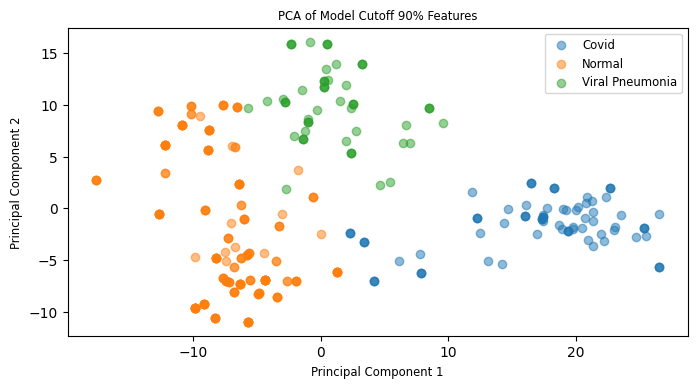

In [361]:
# Define colors for each class for plotting. Make sure the number of colors matches the number of classes.
colors = ['blue', 'green', 'red']

plt.figure(figsize=(8, 4))
for i, class_name in enumerate(class_names):
    # Select indices of points belonging to the current class label.
    indices = np.where(labels == i)

    # Plot the PCA results for the current class with its corresponding color and label.
    # pca_result[indices, 0] and pca_result[indices, 1] extract the 1st and 2nd principal components.
    plt.scatter(pca_result[indices, 0], pca_result[indices, 1], label=class_name, alpha=0.5)

plt.legend(fontsize='small')
plt.title('PCA of Model Cutoff 90% Features', fontsize='small')
plt.xlabel('Principal Component 1', fontsize='small')
plt.ylabel('Principal Component 2', fontsize='small')
plt.show()